## Advanced NLP - Final Project: Predicting Amazon Review Categories
Group: Erika Gutierrez, Lucas Santos, Margherita Phillip and Renato Vassalo

## Guidelines

Here are the guidelines. The objective is to go from a baseline model to a better one with DL. I would like you to follow in the final report:
* Explain briefly the classification you tackle, the random classifier performance and the state-of-the-art for this task
* The choice of the metrics to evaluate the models
* A clear datasets split and descriptive statistics of the sets. Train / development and test sets
* Implementation of a baseline (ie non ML solution) + metrics on test set
* Implementation of a RNN solution + metrics on test set
* Implementation of a BERT model + metrics on test set
* A few examples with their predicted outputs for each of the three implementations
* Error Analysis of the models: where did it learn well / bad ?
* Comment the metrics: can you explain the metrics difference between implementations? Where do you stand regarding SOA/random classifier?
* Biases: Try to identify any type of bias in the models
Improve your BERT solution depending on error analysis, biases or other analysis you think is relevant
* Next steps: What are the main limitations of your models? What would be the next steps to improve it?
You should comment any decision you take regarding your development. 


To evaluate the final report I will take into consideration:
* Quality and clarity of report, notebook and code
* The difficulty of the task (depends on the dataset mainly, the easier the task the higher should be the results)
* Relevance of observations related to evaluations, error analysis, biases and next steps
* Quality of the defense (April 3rd or 4th)

In [254]:
# install deps
#!pip install datasets transformers sentence_transformers umap-learn
#!python -m spacy download en_core_web_md

# dataset
#from datasets import load_dataset
import pandas as pd
import csv
import seaborn as sns

# model
#from transformers import AutoTokenizer, TFAutoModel, pipeline
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
#import tensorflow as tf
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, precision_score
#from sentence_transformers import SentenceTransformer
import spacy

# utils
from sklearn.utils import shuffle
import numpy as np
import string
from collections import Counter
#from sklearn.linear_model import Ridge
#from sklearn.metrics.pairwise import cosine_similarity
#import umap.umap_ as umap
from sklearn.pipeline import Pipeline
#from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud
from sklearn.pipeline import Pipeline, make_pipeline

#visualize
import matplotlib.pyplot as plt
%matplotlib inline

## Load dataset

In [255]:
# Takes 1-2 minutes to load 
df_og = pd.read_csv('amazon_reviews_multilingual_US_v1_00-001.tsv', sep='\t', header=0, on_bad_lines='skip')

## Data set and task overview: predicting amazon review category

We work with the amazon review data set: https://huggingface.co/datasets/amazon_us_reviews

Our aim is to predict, which category the review belongs to. As there are tens of categories, this would be a difficult and computationally very intensive task. Therefore we work with only a subset of five categories. We drop the rest of the data and deliberately choose categories that have a comparable number of entries - omitting categories such as `Mobile Apps` or `Music` for which there are an order of magnitude more data points.

We also select a couple of categories that may be slightly harder to predict due to similarities in the reviews - namely kitchen and home.





**update according to final choice**

These are the categories we work with. The full list of available categories is listed below.
1. shoes_dataset = load_dataset('amazon_us_reviews', 'Shoes_v1_00')
2. toys_dataset = load_dataset('amazon_us_reviews', Toys_v1_00')
3. kitchen_dataset = load_dataset('amazon_us_reviews', 'Kitchen_v1_00')
4. Furniture_dataset = load_dataset('amazon_us_reviews', 'Furniture_v1_00')
5. digital_ebook_dataset = load_dataset('amazon_us_reviews', 'Digital_Ebook_Purchase_v1_01')

Available categories: 
- 'Wireless_v1_00',
- 'Watches_v1_00',
- 'Video_Games_v1_00',
- 'Video_DVD_v1_00',
- 'Video_v1_00', 
- 'Toys_v1_00',
- 'Tools_v1_00',
- 'Sports_v1_00',
- 'Software_v1_00',
- 'Shoes_v1_00',
- 'Pet_Products_v1_00',
- 'Personal_Care_Appliances_v1_00', 
- 'PC_v1_00',
- 'Outdoors_v1_00',
- 'Office_Products_v1_00',
- 'Musical_Instruments_v1_00',
- 'Music_v1_00',
- 'Mobile_Electronics_v1_00', 
- 'Mobile_Apps_v1_00',
- 'Major_Appliances_v1_00',
- 'Luggage_v1_00',
- 'Lawn_and_Garden_v1_00',
- 'Kitchen_v1_00',
- 'Jewelry_v1_00',
- 'Home_Improvement_v1_00',
- 'Home_Entertainment_v1_00',
- 'Home_v1_00',
- 'Health_Personal_Care_v1_00',
- 'Grocery_v1_00', 'Gift_Card_v1_00', 
- 'Furniture_v1_00',
- 'Electronics_v1_00',
- 'Digital_Video_Games_v1_00',
- 'Digital_Video_Download_v1_00',
- 'Digital_Software_v1_00',
- 'Digital_Music_Purchase_v1_00', 
- 'Digital_Ebook_Purchase_v1_00',
- 'Camera_v1_00',
- 'Books_v1_00',
- 'Beauty_v1_00',
- 'Baby_v1_00',
- 'Automotive_v1_00',
- 'Apparel_v1_00',
- 'Digital_Ebook_Purchase_v1_01', 
- 'Books_v1_01',
- 'Books_v1_02']


### Selecting categories

As discussed above, the original dataset is too big. Thus we select some categories to proceed with our task of category prediction.

(Still a big dataset with more than 1M rows...)

In [256]:
# reset the data if desired (rather than importing from scratch)
df_1 = df_og.copy()

# all five categories
categories = ['Toys',  'Electronics', 'Shoes', 'Home', 'Kitchen'] 

# three categories
#categories = ['Shoes', 'Home', 'Kitchen'] #We can change the categories - 'Toys', 'Electronics',
#df_1 = df_1.sample(frac=0.1, replace=False, random_state=1)
df_1 = df_1[df_1['product_category'].isin(categories)]

# Missing values
df_1 = df_1.dropna()

print(df_1['product_category'].value_counts())
print('-------')
print('Shape:', df_1.shape)
print('-------')
print('Features:', df_1.columns)

Toys           57456
Electronics    11421
Shoes           7342
Home            1998
Kitchen         1834
Name: product_category, dtype: int64
-------
Shape: (80051, 15)
-------
Features: Index(['marketplace', 'customer_id', 'review_id', 'product_id',
       'product_parent', 'product_title', 'product_category', 'star_rating',
       'helpful_votes', 'total_votes', 'vine', 'verified_purchase',
       'review_headline', 'review_body', 'review_date'],
      dtype='object')


### Review category prevalence

/tmp/ipykernel_10299/275576359.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


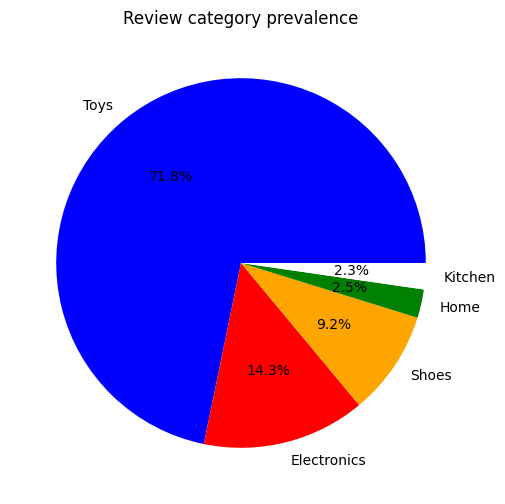

In [257]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
y = df_1['product_category'].value_counts().values / len(df_1) * 100
ax.pie(y, colors=['blue', 'red', 'orange', 'green', 'white'], autopct='%1.1f%%', labels=['Toys',  'Electronics', 'Shoes', 'Home', 'Kitchen']) #
ax.set_title('Review category prevalence')
fig.show()

## Class imbalance

In [258]:
df_1 = df_1[['review_body', 'product_category']]
df_1

,review_body,product_category
28949,While this is the sleek 90's version of the ch...,Toys
32892,I loved it when my children first received thi...,Toys
33568,my daughter can beat this phone up and it stil...,Toys
33746,It is so wonderful to see a childhood favorite...,Toys
34450,Do you need to use your phone but can't pry it...,Toys
...,...,...
6900671,Amps aren't supposed to make headphones sound ...,Electronics
6900805,If you have played the other ticket to ride ga...,Toys
6900820,very good quality one of the best looking blad...,Toys
6900822,one of the best battle tops made very solid an...,Toys


In [259]:
df_toys = df_1[df_1['product_category']=='Toys']
df_toys.shape

(57456, 2)

In [260]:
df_not_toys = df_1[df_1['product_category']!='Toys']
df_not_toys.shape

(22595, 2)

In [261]:
# set a subsample of size category 1 (electronics)
df_toys_downsampled = df_toys.sample(df_1[df_1['product_category']=='Electronics'].shape[0])
df_toys_downsampled.shape

(11421, 2)

In [262]:
df_balanced = pd.concat([df_toys_downsampled, df_not_toys])
df_balanced.shape

(34016, 2)

/tmp/ipykernel_10299/2492327138.py:5: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


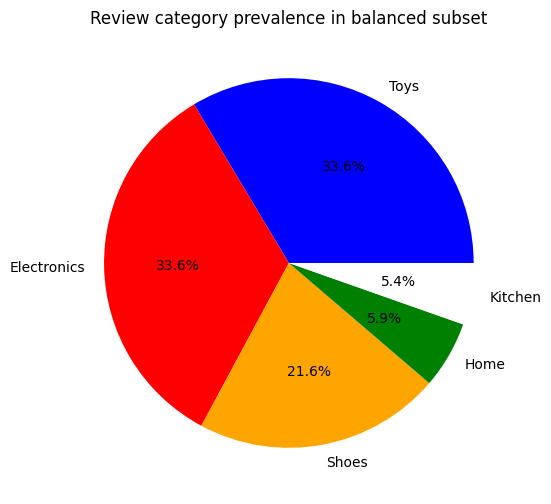

In [263]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
y = df_balanced['product_category'].value_counts().values / len(df_balanced) * 100
ax.pie(y, colors=['blue', 'red', 'orange', 'green', 'white'], autopct='%1.1f%%', labels=['Toys',  'Electronics', 'Shoes', 'Home', 'Kitchen']) #
ax.set_title('Review category prevalence in balanced subset')
fig.show()

## Tokenization and word clouds
We first define a spacy tokenizer and go on to generate separate word clouds for each category.

In [264]:
nlp = spacy.load("en_core_web_sm", exclude=["ner"])

# extracting all the adjectives and averbs of each text
def spacy_tokenizer(texts, nlp=nlp):
  docs = nlp.pipe(texts)
  tokens = []
  for doc in tqdm(docs, total=len(texts)):
    _tokens = [tok.text.lower() for tok in doc 
               if tok.pos_ in ['ADJ', 'ADV']]
    tokens.append(_tokens)
  return tokens

In [265]:
df_balanced['review_body'] = df_balanced['review_body'].astype(str)

# takes around 5 min to run
tokens_shoes = spacy_tokenizer(df_balanced.loc[df_balanced.loc[:, 'product_category'] == 'Toys', 'review_body'].values)
tokens_toys = spacy_tokenizer(df_balanced.loc[df_balanced.loc[:, 'product_category'] == 'Electronics', 'review_body'].values)
tokens_electronics = spacy_tokenizer(df_balanced.loc[df_balanced.loc[:, 'product_category'] == 'Shoes', 'review_body'].values)
tokens_home = spacy_tokenizer(df_balanced.loc[df_balanced.loc[:, 'product_category'] == 'Home', 'review_body'].values)
tokens_kitchen = spacy_tokenizer(df_balanced.loc[df_balanced.loc[:, 'product_category'] == 'Kitchen', 'review_body'].values)

100%|██████████| 1834/1834 [00:05<00:00, 342.59it/s]


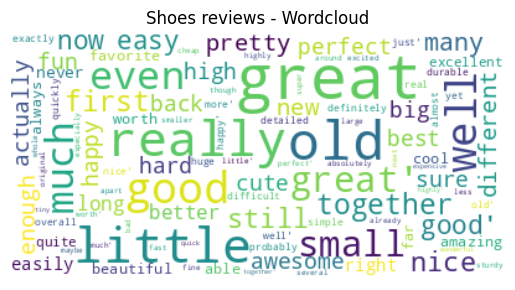

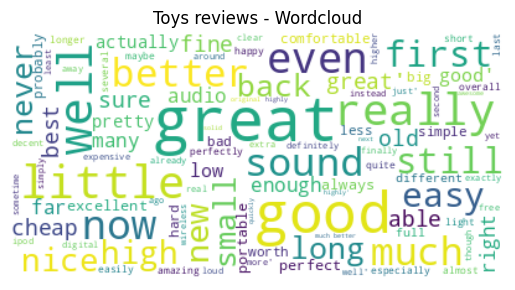

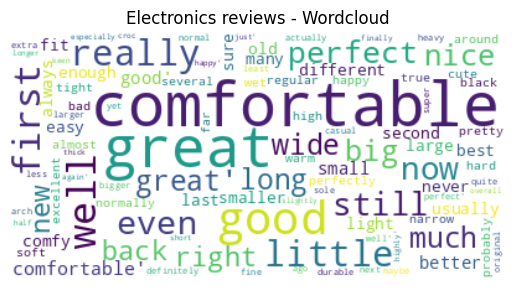

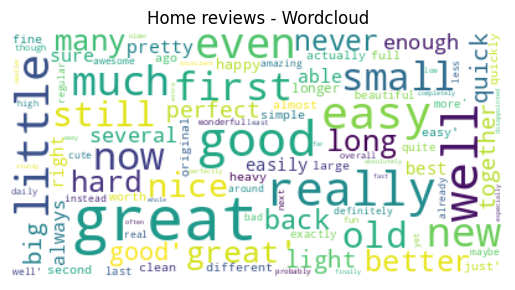

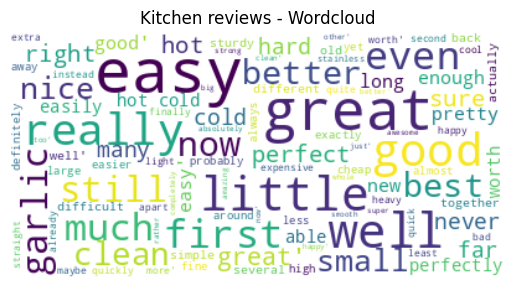

In [266]:
# generating wordclouds

texts = [' '.join(tokens) for tokens in tokens_shoes]
shoes_wordcloud = WordCloud(max_font_size=50, 
                               max_words=100, 
                               background_color="white").generate(str(texts))
plt.figure()
plt.title("Shoes reviews - Wordcloud")
plt.imshow(shoes_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

texts_2 = [' '.join(tokens) for tokens in tokens_toys]
toys_wordcloud = WordCloud(max_font_size=50, 
                               max_words=100, 
                               background_color="white").generate(str(texts_2))
plt.figure()
plt.title("Toys reviews - Wordcloud")
plt.imshow(toys_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

texts_3 = [' '.join(tokens) for tokens in tokens_electronics]
electronics_wordcloud = WordCloud(max_font_size=50, 
                               max_words=100, 
                               background_color="white").generate(str(texts_3))
plt.figure()
plt.title("Electronics reviews - Wordcloud")
plt.imshow(electronics_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


texts_4 = [' '.join(tokens) for tokens in tokens_home]
home_wordcloud = WordCloud(max_font_size=50, 
                               max_words=100, 
                               background_color="white").generate(str(texts_4))
plt.figure()
plt.title("Home reviews - Wordcloud")
plt.imshow(home_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

texts_5 = [' '.join(tokens) for tokens in tokens_kitchen]
kitchen_wordcloud = WordCloud(max_font_size=50, 
                               max_words=100, 
                               background_color="white").generate(str(texts_5))
plt.figure()
plt.title("Kitchen reviews - Wordcloud")
plt.imshow(kitchen_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Baseline models
We work with two baseline models:
1. Random classifier - we expect this to perform badly as there are five categories.
2. A logistic regression - which takes the vectorised text as an input. 



We first define a function to give us key metrics of precision and recall for all of the models we will try. 
- Precision/ positive predictive value:

$$\frac{true\_positives}{true\_positives + false\_positives}$$

- Recall/ sensitivity:

$$\frac{true\_positives}{true\_positives + false\_negatives}$$

In [267]:
# defining the metrics
def get_metrics(y_trues, y_preds, verbose=True):

  recall_macro = recall_score(y_trues, y_preds, average = "macro") * 100          
  precision_macro = precision_score(y_trues, y_preds, average = "macro") * 100 

  recall_weighted = recall_score(y_trues, y_preds, average = "weighted") * 100          
  precision_weighted = precision_score(y_trues, y_preds, average = "weighted") * 100

  if verbose:
    print(f'Precision: {precision_macro:.2f}')
    print(f'Recall: {recall_macro:.2f}')

    print(f'Precision (weighted average): {precision_weighted:.2f}')
    print(f'Recall (weighted average): {recall_weighted:.2f}')

  return recall_macro, precision_macro, recall_weighted, precision_weighted

### Baseline 1: Random Classifier

We calculate the metrics for making random guesses. As expected, this 'model' can only get it right about 1/5, so 20% of the time as there a five categories.

In [268]:
precisions, recalls = [], []
precisions_w, recalls_w = [], []

for i in range(1000):
  trues = np.random.randint(0, 5, 1000)
  preds = np.random.randint(0, 5, 1000)

  precision, recall, precision_w, recall_w = get_metrics(trues, preds, verbose=False)
  
  precisions.append(precision)
  recalls.append(recall)

  precisions_w.append(precision_w)
  recalls_w.append(recall_w)

print('Final metrics')
print(f'Precision: {np.mean(precisions):.2f} ({np.std(precisions):.2f})')
print(f'Recall: {np.mean(recalls):.2f} ({np.std(recalls):.2f})')

print(f'Precision (weighted): {np.mean(precisions_w):.2f} ({np.std(precisions_w):.2f})')
print(f'Recall (weighted): {np.mean(recalls_w):.2f} ({np.std(recalls_w):.2f})')

Final metrics
Precision: 20.02 (1.21)
Recall: 20.01 (1.21)
Precision (weighted): 20.02 (1.21)
Recall (weighted): 20.10 (1.22)


### Baseline 2: Logistic Regression
We first convert the text to numerical features through the TfidfVectorizer. Then we fit and predict, usuing a multinomial logistic regression. 

We only use a simple test-train split rather than additionally generating a validation set as we do not go through a process of tuning hyperparameters.

**Question: should we lowercase and lemmatize before vectorisation so that we reduce dimensions and possibly get better scores?**


In [269]:
RANDOM_SEED = 2000

# First Split for Train and Test
x_train,x_test,y_train,y_test = train_test_split(df_balanced['review_body'], df_balanced['product_category'], test_size=0.25, random_state=RANDOM_SEED,shuffle=True)

# Next split Train in to training and validation
x_tr,x_val,y_tr,y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=RANDOM_SEED,shuffle=True)

In [270]:
# Convert text data to numerical features
vectorizer = TfidfVectorizer()
X_train_v = vectorizer.fit_transform(x_train)
X_test_v = vectorizer.transform(x_test)

# Train logistic regression model
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(X_train_v, y_train)

# Evaluate model on test set
y_pred_log = model.predict(X_test_v)

/home/renatovassallo/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [271]:
get_metrics(y_test, y_pred_log)

Precision: 91.16
Recall: 78.28
Precision (weighted average): 89.32
Recall (weighted average): 88.82


(78.27581972528692, 91.15742284289648, 88.8170272812794, 89.31627363416456)

### LIME

In [272]:
#!pip install eli5
#!pip install scipy

import scipy
def monkeypath_itemfreq(sampler_indices):
   return zip(*np.unique(sampler_indices, return_counts=True))

scipy.stats.itemfreq=monkeypath_itemfreq

from scipy.stats import itemfreq

import eli5
from eli5.lime import TextExplainer

from lime import lime_text
from lime.lime_text import LimeTextExplainer

In [273]:
vec = TfidfVectorizer(min_df=3, stop_words='english',
                      ngram_range=(1, 2), lowercase=True)

clf = LogisticRegression(multi_class='multinomial', solver='lbfgs')
pipe = make_pipeline(vec, clf)
pipe.fit(x_tr, y_tr)

/home/renatovassallo/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(min_df=3, ngram_range=(1, 2),
                                 stop_words='english')),
                ('logisticregression',
                 LogisticRegression(multi_class='multinomial'))])

In [274]:
df_balanced.product_category.unique()

array(['Toys', 'Electronics', 'Kitchen', 'Home', 'Shoes'], dtype=object)

In [275]:
categories = ['Electronics', 'Home', 'Kitchen',  'Shoes', 'Toys', ] 

# Define your LIME explainer
explainer = LimeTextExplainer(class_names=categories)

In [276]:
# Generate an explanation for a specific prediction
idx = 100 # index of the prediction to explain
x = x_test.iloc[idx] # input sequence for the prediction

# original sentence
print('-------------')
print('Original sentence: ', x)
print('-------------')
print('Actual label: ', y_test.iloc[idx])

exp = explainer.explain_instance(x, pipe.predict_proba, num_features=6, labels=[0,1,2,3,4])
exp.show_in_notebook(text=False)

-------------
Original sentence:  When i first received this toy i was so excited to pump it up for my 16month old son.<br />Unfortunately , i found out that the pool doesn't  hold the air for long , actually not even for an hour! I was so frustrated. I will look into patching the pool with attached patch kit. So hopefully soap and water will help identify all the holes!<br />This is not a quality product , one chamber for main water area ? it should be at least two , otherwise the entire toy just deflates with one hole :(
-------------
Actual label:  Toys


In [277]:
y_test.reset_index()
x_test.reset_index()

,index,review_body
0,2341770,"When you turn this on there is a slight hum, n..."
1,1327004,Sent as a Christmas gift. The recipient is hap...
2,2922642,I have owned my set now for quite some time an...
3,2228709,Love that these glasses are rechargeable and t...
4,3613697,Husband found this a bit more difficult to ins...
...,...,...
8499,2394833,"Pros: Great headphones, they sound great and t..."
8500,3006862,I took care of the mac address filtering probl...
8501,4745541,Comfortable material and the non-slip is nice ...
8502,5771554,Bought these for my husband and he absolutely ...


In [278]:
# Generate an explanation for a specific prediction
idx = 0 # index of the prediction to explain
x = x_test.iloc[idx] # input sequence for the prediction

# original sentence
print('-------------')
print('Original sentence: ', x)
print('-------------')
print('Actual label: ', y_test.iloc[idx])

exp = explainer.explain_instance(x, pipe.predict_proba, num_features=6, labels=[0,1,2,3,4])
exp.show_in_notebook(text=False)

-------------
Original sentence:  When you turn this on there is a slight hum, not a big deal, my main complaint was that the cable has to be plugged in just right or the sound cuts out. I plugged in a cable that didnt come with the amp, and they worked fine tho, so this isnt a big deal if you have another cable you can use. The amp has 4 settings, a flat boost, a bass boost a mid boost and a power reducer for high output sources. You can also control the volume on the amp
-------------
Actual label:  Electronics


In [279]:
# Generate an explanation for a specific prediction
idx = 1 # index of the prediction to explain
x = x_test.iloc[idx] # input sequence for the prediction

# original sentence
print('-------------')
print('Original sentence: ', x)
print('-------------')
print('Actual label: ', y_test.iloc[idx])

exp = explainer.explain_instance(x, pipe.predict_proba, num_features=6, labels=[0,1,2,3,4])
exp.show_in_notebook(text=False)

-------------
Original sentence:  Sent as a Christmas gift. The recipient is happy with it's construction and performance. It was ordered at the last moment and arrived at its destination with time to spare during a very busy shipping season.
-------------
Actual label:  Kitchen


In [280]:
# Generate an explanation for a specific prediction
idx = 8501 # index of the prediction to explain
x = x_test.iloc[idx] # input sequence for the prediction

# original sentence
print('-------------')
print('Original sentence: ', x)
print('-------------')
print('Actual label: ', y_test.iloc[idx])

exp = explainer.explain_instance(x, pipe.predict_proba, num_features=6, labels=[0,1,2,3,4])
exp.show_in_notebook(text=False)

-------------
Original sentence:  Comfortable material and the non-slip is nice at work (I'm a nurse) but it did run a little small so I don't wear them very often.
-------------
Actual label:  Shoes


In [281]:
# Generate an explanation for a specific prediction
idx = 8503 # index of the prediction to explain
x = x_test.iloc[idx] # input sequence for the prediction

# original sentence
print('-------------')
print('Original sentence: ', x)
print('-------------')
print('Actual label: ', y_test.iloc[idx])

exp = explainer.explain_instance(x, pipe.predict_proba, num_features=6, labels=[0,1,2,3,4])
exp.show_in_notebook(text=False)

-------------
Original sentence:  I may be blessed, but my sweeper is awesome.  we live in the country and I homeschool and have three children under the age of 6.  we also own goats, dog, chickens, cats.  we get lots of dust.  i also have at least 1000sq foot of tile alone, and another of hard wood floors that collect lots and lots of dust daily.  i would normally sweep twice daily, i hate to see dirt, dust, hay you name it on the ground and this would take a loooonnnnnggggg time.  this sweeper was a gift from my mom who just came and spent two weeks visiting and helped daily clean the floors.  she said i needed this sweeper thing.  i was very unsure of this product. but she purchased it for me.  i got it put it together in charged the battery. it works so well.  it takes me about 5 minutes to zip through the floors, verses 20 min.  to a busy homeschool mom this is amazing.    sorry so many of you are having problems.  mine works great!  God bless you all and remember Jesus is coming 

## Recurrent Neural Networks Model (RNN)

In [282]:
# reset dataset to only include chosen categories
df_2 = df_balanced.copy()

In [283]:
#df_2.reset_index()
print(df_2.shape)
df_2.head()

(34016, 2)


,review_body,product_category
3410642,Perfect foe my daughter!! Now she can have her...,Toys
5983312,My daughters favorite character. Would receive...,Toys
4264180,Great give for the kids they love nerf guns ha...,Toys
5015235,Quick shipping daughter loved it,Toys
3268991,"This is a Christmas gift for my granddaughter,...",Toys


In [284]:
df_2["review_body"][231690]

'Wow! I just used my Rosle garlic press for the first time today. I cant believe how easily the unpeeled garlic went right through the holes. One good squeeze was all it took, the garlic almost squirted out. All that was left inside the press were the skins. This is a beautiful piece of engineering, made of heavy duty stainless steel. It seems to be a very durable kitchen tool. A breeze to wash, the garlic rinsed off easily under running water.<BR> <br />This item is a little expensive but I feel like it was worth the price. After fighting with inferior presses for many years, I finally found a great one. I like the Rosle garlic press so much I just ordered three more, one for each of my children.'

### Additional  library imports

In [285]:
import numpy as np
from collections import Counter

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
#stop = set(stopwords.words('english'))

from sklearn import metrics

import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from keras.callbacks import ModelCheckpoint, EarlyStopping

import keras
from keras.models import Sequential
from keras import layers

from keras.layers import Dense, Activation
from keras.layers import LSTM
from keras.optimizers import RMSprop

#tfds.disable_progress_bar()
import matplotlib.pyplot as plt

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/renatovassallo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Pre-processing
 - adding bespoke stopwords
 - removing punctuation and stopwords, and generating lower case text
 - generate a vocaulary list and a dictionary as well as its reverse

#### Removing punctuation and stopwords

In [286]:
new_stopwords = ["br", 'would', 'one']

stpwrd = stopwords.words('english')
stpwrd.extend(new_stopwords)

We define two functions to pre-pocess the text:
1. remove_punct - removes punctuation, namely `!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~`
2. remove_stopwords - removes stopwords, such as 'and', 'or', 'at', 'don't' and also makes text lower case 

While some stopwords may be important for sentiment analysis, we are focussed on being able to predict the category.

In [287]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [288]:
def remove_punct(text):
    translator = str.maketrans("", "", string.punctuation)
    return text.translate(translator)


def remove_stopwords(text):
    filtered_words = [word.lower() for word in text.split() if word.lower() not in stpwrd]
    return " ".join(filtered_words)

In [289]:
# just in case a review is just a number
df_2['review_body'] = df_2['review_body'].astype(str)

In [290]:
df_2["review_body_punc"] = df_2.review_body.map(remove_punct)
df_2["review_body_final"] = df_2.review_body_punc.map(remove_stopwords)

df_2.head()

,review_body,product_category,review_body_punc,review_body_final
3410642,Perfect foe my daughter!! Now she can have her...,Toys,Perfect foe my daughter Now she can have her o...,perfect foe daughter 34mario34 character plays...
5983312,My daughters favorite character. Would receive...,Toys,My daughters favorite character Would receive ...,daughters favorite character receive 5 stars l...
4264180,Great give for the kids they love nerf guns ha...,Toys,Great give for the kids they love nerf guns ha...,great give kids love nerf guns get girl niece ...
5015235,Quick shipping daughter loved it,Toys,Quick shipping daughter loved it,quick shipping daughter loved
3268991,"This is a Christmas gift for my granddaughter,...",Toys,This is a Christmas gift for my granddaughter ...,christmas gift granddaughter hasnt gotten yet ...


#### Numerical target column

It is easier to work with a numerical target column.

In [291]:
df_2.product_category.unique()

array(['Toys', 'Electronics', 'Kitchen', 'Home', 'Shoes'], dtype=object)

In [292]:
#categories = ['Shoes', 'Home', 'Kitchen','Toys', 'Electronics'] 
df_2['target'] = df_2['product_category'].replace(['Toys',  'Electronics', 'Shoes', 'Home', 'Kitchen'],
                        [0, 1, 2, 3, 4], inplace=False) 


In [293]:
df_2.iloc[0:1,:]

,review_body,product_category,review_body_punc,review_body_final,target
3410642,Perfect foe my daughter!! Now she can have her...,Toys,Perfect foe my daughter Now she can have her o...,perfect foe daughter 34mario34 character plays...,0


#### Turn reviews into vectors

We count the unique words in the new review_body. There are 69,947 unique words and we show the most common ones.

In [294]:
def counter_word(text_col):
    count = Counter()
    for text in text_col.values:
        for word in text.split():
            count[word] += 1
    return count


counter = counter_word(df_2["review_body_final"])

In [295]:
num_unique_words = len(counter)
print("Number of unique words: " + str(num_unique_words))
counter.most_common(15)

Number of unique words: 46710


[('great', 10039),
 ('like', 6925),
 ('good', 6819),
 ('use', 5978),
 ('get', 5469),
 ('sound', 5311),
 ('well', 5074),
 ('love', 4681),
 ('little', 4643),
 ('really', 4526),
 ('time', 4282),
 ('bought', 4272),
 ('quality', 4241),
 ('dont', 4097),
 ('product', 4002)]

We split the data into a training and a validation set and extrat the text and the target columns to separate arrays. We show the dimensions and an example of the stored values.

In [296]:
RANDOM_SEED = 2000

# First Split for Train and Test
x_train,x_test,y_train,y_test = train_test_split(df_2['review_body_final'], df_2['target'], test_size=0.25, random_state=RANDOM_SEED,shuffle=True)

# Next split Train in to training and validation
x_tr,x_val,y_tr,y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=RANDOM_SEED,shuffle=True)

print(x_tr.shape, x_val.shape)

(20409,) (5103,)


We employ a tokenizer to generate a dictionary with indices.

In [297]:
# vectorize a text corpus by turning each text into a sequence of integers
tokenizer = Tokenizer(num_words=num_unique_words)
tokenizer.fit_on_texts(x_tr) # fit only to training

# each word has unique index
word_index = tokenizer.word_index
type(word_index)  # dict

word_index_examples = {k: word_index[k] for k in list(word_index)[200:205]}
print(word_index_examples)

# Reverse the indices
# flip (key, value)
reverse_word_index = dict([(idx, word) for (word, idx) in word_index.items()])

reverse_index_examples = {k: reverse_word_index[k] for k in list(reverse_word_index)[200:205]}
print(reverse_index_examples)

{'foot': 201, '1': 202, 'plastic': 203, 'clean': 204, 'needed': 205}
{201: 'foot', 202: '1', 203: 'plastic', 204: 'clean', 205: 'needed'}


In [298]:
def decode(sequence):
    return " ".join([reverse_word_index.get(idx, "?") for idx in sequence])

No we can use the dictionary to transform each sentence into a sequence of indices (key) that refer to the values in the dictionray. We can use the decoder for the reverse process.

In [299]:
train_sequences = tokenizer.texts_to_sequences(x_tr)
valid_sequences = tokenizer.texts_to_sequences(x_val)
test_sequences = tokenizer.texts_to_sequences(x_test)

print(x_tr[0:3])
print(train_sequences[0:3])

print('_________________________________________________________________________________________________________________________________________')

decoded_text = decode(train_sequences[3])

print(train_sequences[3])
print(decoded_text)

6476665    clock helps grandson get morning get ready sch...
5202894    love letter incredibly brief yet deep game enc...
2171561    use iphone motorcycle helmet giro tuneups helm...
Name: review_body_final, dtype: object
[[1661, 828, 326, 5, 1197, 5, 1118, 872, 7, 3591, 10, 12046], [10, 4046, 1266, 3717, 228, 1214, 18, 4434, 3281, 683, 7640, 267, 1331, 2386, 1111, 217, 16455, 109, 633, 18, 1737, 6317, 2386, 256, 658, 336, 2921, 6318, 1160, 9917, 48, 504, 633, 718, 18, 3868, 188, 958, 341, 2337, 2120, 3869, 2849, 156, 1145], [4, 220, 1818, 1819, 16456, 16457, 1819, 337, 109, 1, 399, 1043, 196]]
_________________________________________________________________________________________________________________________________________
[62, 198, 578, 1081, 1028, 2170, 1081, 221, 409, 2850, 492, 9, 16458, 1215, 44, 243, 4646, 444, 62, 2660, 70, 56, 1, 9918, 4047, 518, 128, 1970]
crocs cute comfy stylish oh yeah stylish said black espresso colors little scalloped opening make top feminine comf

The RNN model will take inputs of equal length. We therefore check how long the review texts are. It seems that the majority have less than 30 words, so we use that as the input size. For shorter reviews, we pad the remaning spaces with zeros.

In [300]:
df_2['word_count'] = df_2['review_body_final'].str.count(' ') + 1
df_2['word_count'].describe()

count    34016.000000
mean        30.330609
std         49.776915
min          1.000000
25%          9.000000
50%         17.000000
75%         34.000000
max       2531.000000
Name: word_count, dtype: float64

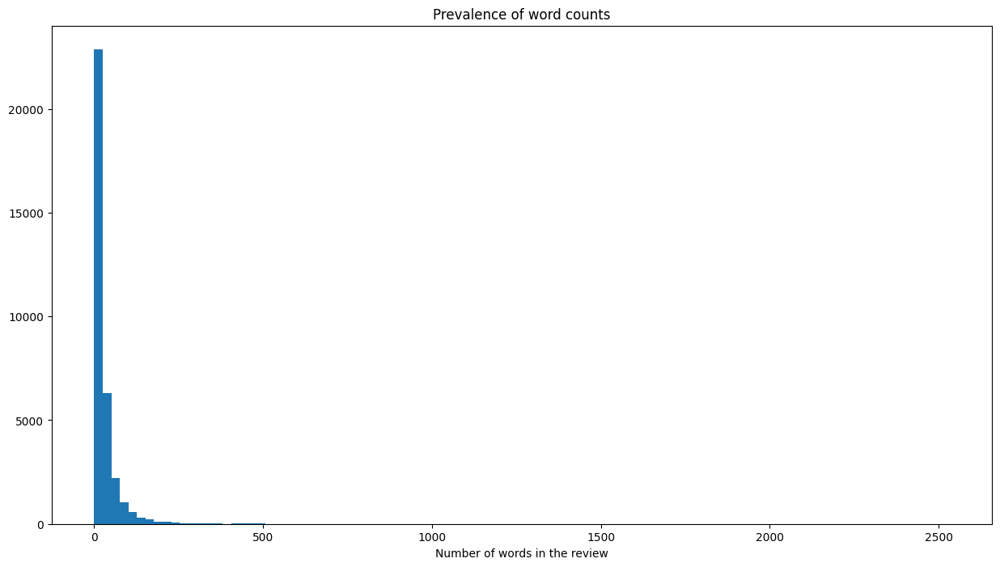

In [301]:
#matplotlib.pyplot.hist
plt.figure(figsize=(15,8))
plt.hist(df_2['word_count'], bins=100)
plt.title('Prevalence of word counts')
plt.xlabel('Number of words in the review')
plt.show()

In [302]:
# Max number of words in a sequence
max_length = 40

# Padding
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding="post", truncating="post")
valid_padded = pad_sequences(valid_sequences, maxlen=max_length, padding="post", truncating="post")
test_padded = pad_sequences(test_sequences, maxlen=max_length, padding="post", truncating="post")

train_padded.shape, valid_padded.shape, test_padded.shape

((20409, 40), (5103, 40), (8504, 40))

### RNN model training
Here we specify the archiecture of the neural network with an embedding layer at the start and a final output layer that returns a probability of each label being the true one for a given review.



In [303]:
model = Sequential()

In [304]:
# Embedding layer: https://keras.io/api/layers/core_layers/embedding/

model.add(layers.Embedding(input_dim = num_unique_words, output_dim = 32, input_length=max_length))

model.add(layers.LSTM(32, dropout=0.2))
#model.add(layers.Dense(32, activation="relu"))
model.add(layers.Dense(10, activation="relu"))

model.add(layers.Dense(5, activation="softmax")) # 3 if using 3 categories  - alternative: sigmoid

model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 40, 32)            1494720   
                                                                 
 lstm_2 (LSTM)               (None, 32)                8320      
                                                                 
 dense_4 (Dense)             (None, 10)                330       
                                                                 
 dense_5 (Dense)             (None, 5)                 55        
                                                                 
Total params: 1,503,425
Trainable params: 1,503,425
Non-trainable params: 0
_________________________________________________________________


2023-04-01 22:30:16.313325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-04-01 22:30:16.314608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-04-01 22:30:16.315536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [305]:
loss = keras.losses.SparseCategoricalCrossentropy() # alternative: categorical_crossentropy - but no binary keras.losses.BinaryCrossentropy(from_logits=False)
optim = keras.optimizers.Adam(lr=0.001)
metric = ["accuracy"]

model.compile(loss=loss, optimizer=optim, metrics=metric)

/home/renatovassallo/.local/lib/python3.10/site-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [306]:
print(valid_padded.shape)
print(y_val.shape)

(5103, 40)
(5103,)


In [307]:
# fit the model

history = model.fit(
  train_padded,
  y_tr,
  epochs=20, #5 were not enough for convergrence
  batch_size=20,
  #callbacks=[EarlyStopping(monitor='val_loss', patience=3)], #, min_delta=0.0001)],
  validation_data=(valid_padded, y_val)
)


Epoch 1/20


2023-04-01 22:30:16.816994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-04-01 22:30:16.818312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-04-01 22:30:16.819360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

1020/1021 [============================>.] - ETA: 0s - loss: 0.7552 - accuracy: 0.7185

2023-04-01 22:30:36.726318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-04-01 22:30:36.727741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-04-01 22:30:36.728836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

1021/1021 [==============================] - 21s 19ms/step - loss: 0.7551 - accuracy: 0.7185 - val_loss: 0.5206 - val_accuracy: 0.8246
Epoch 2/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.3877 - accuracy: 0.8614 - val_loss: 0.4735 - val_accuracy: 0.8452
Epoch 3/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.2933 - accuracy: 0.8936 - val_loss: 0.3927 - val_accuracy: 0.8673
Epoch 4/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.2382 - accuracy: 0.9190 - val_loss: 0.4110 - val_accuracy: 0.8748
Epoch 5/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.2093 - accuracy: 0.9303 - val_loss: 0.4090 - val_accuracy: 0.8701
Epoch 6/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.1880 - accuracy: 0.9354 - val_loss: 0.4419 - val_accuracy: 0.8662
Epoch 7/20
1021/1021 [==============================] - 19s 19ms/step - loss: 0.1752 - accuracy: 0.9405 - val_loss: 0.4632 - val_accura

### Saving the model

In [308]:
model.save_weights('models/rnn_5_5cat.h5')   # Saturday 01 April
# model_new.load_weights('rnn_1_3cat.h5')

In [309]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


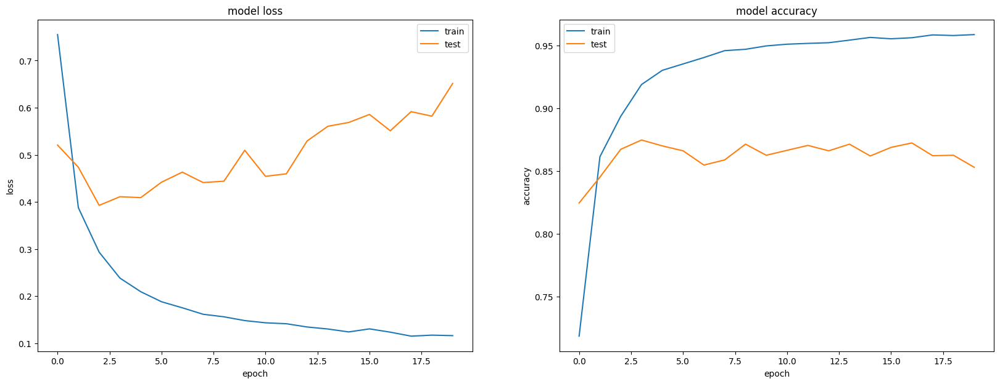

In [310]:
figure, axes = plt.subplots(1, 2, figsize=(20, 7))
# loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')

# accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')

#show
plt.show()



### Evaluate the RNN model

We use the model above to make predictions for which category each of the reviews in the validation set is. As shown, the y_pred output indicates which of the (five) categories is the most likely for each review. As we only want a single predicted category for each review, we apply an argmax argument, which returns the index with the highest value.

Now we can compare the predictions to the true label values of the validation set. We show a confustion matrix as well as a more detailed breakdown of  precision, recall and  f1-score for each category.

Overall, the RNN models we speciy are is not able to outperform the Logistic Regression above.

In [311]:
y_pred = model.predict(test_padded)
y_pred

 14/266 [>.............................] - ETA: 0s  

2023-04-01 22:36:46.102557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-04-01 22:36:46.103796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-04-01 22:36:46.104944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

266/266 [==============================] - 1s 3ms/step


array([[1.66336889e-04, 9.99778509e-01, 3.69313852e-07, 4.21843288e-05,
        1.26536452e-05],
       [9.99713182e-01, 9.96193630e-05, 4.73560067e-05, 1.34681817e-04,
        5.16517093e-06],
       [7.63429678e-04, 1.12527458e-03, 1.36246479e-06, 8.08608413e-01,
        1.89501554e-01],
       ...,
       [3.98555203e-05, 2.20650163e-05, 9.99680936e-01, 4.81034385e-06,
        2.52439844e-04],
       [1.11412875e-04, 9.99701142e-01, 9.02593968e-07, 1.63187928e-04,
        2.32824714e-05],
       [6.64454361e-04, 5.53242680e-05, 5.17640444e-07, 7.44201899e-01,
        2.55077749e-01]], dtype=float32)

In [312]:
y_pred_f = np.argmax(y_pred,axis=1)
y_pred_f

array([1, 0, 3, ..., 2, 1, 3])

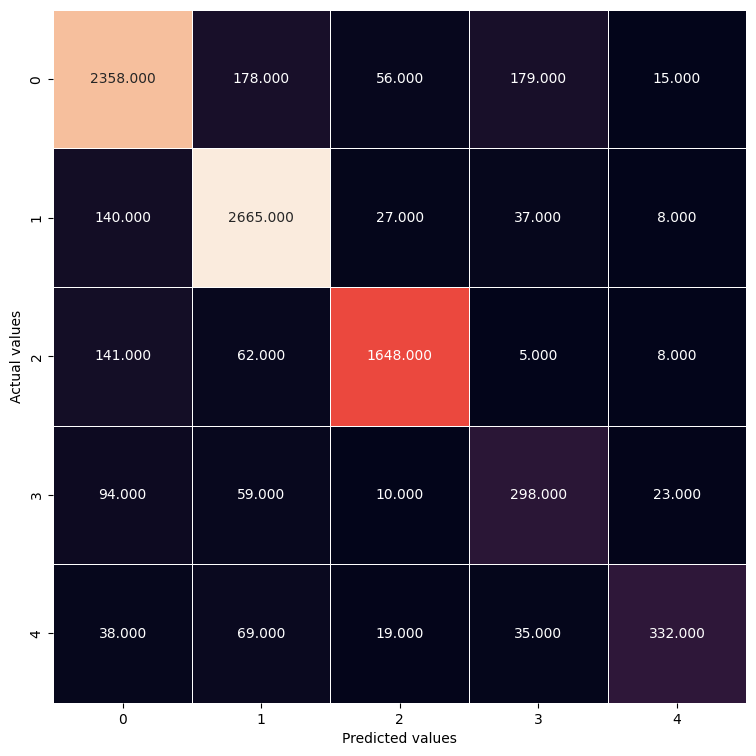

In [313]:
#generates a 9x9 matrix
cm = metrics.confusion_matrix(y_test, y_pred_f)

# turns it into a more digestable heatmap format
plt.figure(figsize = (9,9))
sns.heatmap(cm, annot = True, fmt = '0.3f', linewidth = 0.5,
            square = True, cbar = False)

plt.ylabel('Actual values')
plt.xlabel('Predicted values')
plt.show()

Unsurprisingly, the model performs best for the categories that have the largest support, i.e. toys, shoes and electronics.

Meanwhile home and kitchen not only have fewer reviews to train on, but are also harder to classify as the reviews are likely to use more similar vocabulary.

In [314]:
print(metrics.classification_report(y_test, y_pred_f))

# 'Toys',  'Electronics', 'Shoes', 'Home', 'Kitchen'

              precision    recall  f1-score   support

           0       0.85      0.85      0.85      2786
           1       0.88      0.93      0.90      2877
           2       0.94      0.88      0.91      1864
           3       0.54      0.62      0.57       484
           4       0.86      0.67      0.76       493

    accuracy                           0.86      8504
   macro avg       0.81      0.79      0.80      8504
weighted avg       0.86      0.86      0.86      8504



#### History of models and their performance:

1. Model with **12** epochs, batch size **32**:

````
model.add(layers.Embedding(input_dim = num_unique_words, output_dim = 32, input_length=max_length))

model.add(layers.LSTM(64, dropout=0.1))
model.add(layers.Dense(32, activation="relu"))
model.add(layers.Dense(5, activation="sigmoid")) 
````

Performance on **5** imbalanced categories: 

````              precision    recall  f1-score   support

           0       0.96      0.87      0.91      1468
           1       0.79      0.53      0.64       400
           2       0.76      0.67      0.71       367
           3       0.95      0.98      0.96     11492
           4       0.91      0.86      0.88      2284

    accuracy                           0.94     16011
   macro avg       0.87      0.78      0.82     16011
weighted avg       0.93      0.94      0.93     16011

0:Shoes, 1:Home, 2:Kitchen, 3:Toys, 4:Electronics
```


2. Model with **20** epochs, batch size **32**:

````
model.add(layers.Embedding(input_dim = num_unique_words, output_dim = 32, input_length=max_length))

model.add(layers.LSTM(20, dropout=0.1))
model.add(layers.Dense(10, activation="relu"))
model.add(layers.Dense(5, activation="softmax"))
````

Performance:

````
              precision    recall  f1-score   support

           0       0.96      0.86      0.91      1468
           1       0.64      0.53      0.58       400
           2       0.74      0.62      0.67       367
           3       0.95      0.98      0.96     11492
           4       0.89      0.86      0.88      2284

    accuracy                           0.93     16011
   macro avg       0.83      0.77      0.80     16011
weighted avg       0.93      0.93      0.93     16011
````

3. Model with **200** epochs, batch size **32** and an extra layer:

````
model.add(layers.Embedding(input_dim = num_unique_words, output_dim = 32, input_length=max_length))

model.add(layers.LSTM(64, dropout=0.2))
model.add(layers.Dense(32, activation="relu"))
model.add(layers.Dense(10, activation="relu"))

model.add(layers.Dense(5, activation="softmax"))
````

Performance:

````
              precision    recall  f1-score   support

           0       0.91      0.88      0.90      1468
           1       0.67      0.50      0.57       400
           2       0.75      0.62      0.68       367
           3       0.95      0.97      0.96     11492
           4       0.89      0.87      0.88      2284

    accuracy                           0.93     16011
   macro avg       0.83      0.77      0.80     16011
weighted avg       0.92      0.93      0.92     16011
````

### Improvements through gridsearching RNN parameters

We can also search over lots of other aspects of the model as outlined in detail here: https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

Due to time (and laptop) contratints, we weren't able to experiment with more of them, but here is what else we could have tried to gridsearch over:
-  **optimizers** - although adam seems to consistently perform well, alternative options are ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
- going a level deeper: the **learning rate and momentum** when using the Stochastic Gradient Descent (SDG) rather than Adam
````
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.2)
learn_rate = [0.001, 0.01, 0.1, 0.2, 0.3]
momentum = [0.0, 0.2, 0.4, 0.6, 0.8, 0.9]
param_grid = dict(optimizer__learning_rate=learn_rate, optimizer__momentum=momentum)
`````

- **weight initialisation** for the network
````
init_mode = ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform']
param_grid = dict(model__init_mode=init_mode)
````
- the **activation function** of a dense layer (except for the last one)
````
def create_model(activation='relu'):
    model = Sequential()
    model.add(Dense(12, input_shape=(8,), kernel_initializer='uniform', activation=activation))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
param_grid = dict(model__activation=activation)
````
- regularisation through **dropout** (which apparently is best combined with a weight constraint such as the max norm constraint)
````
def create_model(dropout_rate, weight_constraint):
    model = Sequential()
    model.add(Dense(12, input_shape=(8,), kernel_initializer='uniform', activation='linear', kernel_constraint=MaxNorm(weight_constraint)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
weight_constraint = [1.0, 2.0, 3.0, 4.0, 5.0]
dropout_rate = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
param_grid = dict(model__dropout_rate=dropout_rate, model__weight_constraint=weight_constraint)
````

- even the **number of neurons** in a hidden layer:
````
...
    model.add(Dense(neurons, input_shape=(8,), kernel_initializer='uniform', activation='linear', kernel_constraint=MaxNorm(4)))
neurons = [1, 5, 10, 15, 20, 25, 30]
param_grid = dict(model__neurons=neurons)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
````